In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [2]:
!pip install ultralytics --quiet
!pip install huggingface_hub --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.9/921.9 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 47.1 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
from huggingface_hub import hf_hub_download
from IPython.display import Image
import shutil
from glob import glob
import random
from sklearn.model_selection import train_test_split

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
!git lfs install
!git clone https://huggingface.co/datasets/fairportrobotics/spy-glass-data/

Git LFS initialized.
Cloning into 'spy-glass-data'...
remote: Enumerating objects: 1541, done.
remote: Total 1541 (delta 0), reused 0 (delta 0), pack-reused 1541 (from 1)
Receiving objects: 100% (1541/1541), 210.16 KiB | 3.69 MiB/s, done.
Resolving deltas: 100% (3/3), done.
Filtering content: 100% (764/764), 72.88 MiB | 6.56 MiB/s, done.


In [5]:
!ls drive/MyDrive/spyglass/

classes.txt  custom.yaml  model8n.1.pt	train  val  yolo8n.yaml


In [6]:
!ls spy-glass-data/

classes.txt  README.md	train  val


In [7]:
!rm -fr drive/MyDrive/spyglass/train/images/*
!rm -fr drive/MyDrive/spyglass/train/labels/*
!rm -fr drive/MyDrive/spyglass/val/images/*
!rm -fr drive/MyDrive/spyglass/val/labels/*
!rm -fr /content/runs

In [8]:
!cp spy-glass-data/classes.txt drive/MyDrive/spyglass/classes.txt

In [9]:
!cp -r spy-glass-data/train drive/MyDrive/spyglass/train
!cp -r spy-glass-data/val drive/MyDrive/spyglass/val

In [10]:
base_dir = "/content/drive/MyDrive/spyglass"
yaml_file_name = f"{base_dir}/yolo8n.yaml"
epochs = 100
'''
yaml_file_name = f"{base_dir}/custom.yaml"

train = f"{base_dir}/train"#.replace("/", "\\")
val = f"{base_dir}/val"#.replace("/", "\\")
class_names = []
nc = 0

with open(f"{base_dir}/classes.txt") as file:
    for line in file:
      if nc <  5:
        class_names.append(line.strip())
      #class_names.append(line.strip())
      nc += 1

nc = len(class_names)

with open(yaml_file_name, "w") as file:
    file.write(f"train: {train}\n")
    file.write(f"val: {val}\n")
    file.write(f"nc: {nc}\n")
    names = '", "'.join(class_names)
    file.write(f'names: ["{names}"]')
'''

'\nyaml_file_name = f"{base_dir}/custom.yaml"\n\ntrain = f"{base_dir}/train"#.replace("/", "\\")\nval = f"{base_dir}/val"#.replace("/", "\\")\nclass_names = []\nnc = 0\n\nwith open(f"{base_dir}/classes.txt") as file:\n    for line in file:\n      if nc <  5:\n        class_names.append(line.strip())\n      #class_names.append(line.strip())\n      nc += 1\n\nnc = len(class_names)\n\nwith open(yaml_file_name, "w") as file:\n    file.write(f"train: {train}\n")\n    file.write(f"val: {val}\n")\n    file.write(f"nc: {nc}\n")\n    names = \'", "\'.join(class_names)\n    file.write(f\'names: ["{names}"]\')\n'

In [11]:
  %load_ext tensorboard
  %tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [12]:
# Load the weights from our repository
model = YOLO("yolov8n.pt")

model.train(data=yaml_file_name, epochs=epochs, imgsz=640)
metrics = model.val()
print(metrics)

100%|██████████| 6.25M/6.25M [00:00<00:00, 104MB/s]


Ultralytics 8.3.80 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/spyglass/yolo8n.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 24.5MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 107MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/spyglass/train/train/labels... 573 images, 0 backgrounds, 0 corrupt: 100%|██████████| 573/573 [00:08<00:00, 70.59it/s] 


train: New cache created: /content/drive/MyDrive/spyglass/train/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/spyglass/val/val/labels... 191 images, 0 backgrounds, 0 corrupt: 100%|██████████| 191/191 [00:03<00:00, 60.95it/s] 


val: New cache created: /content/drive/MyDrive/spyglass/val/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.23G      1.466      2.943      1.342         76        640: 100%|██████████| 36/36 [00:17<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        191        846      0.521      0.242      0.143     0.0743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.23G      1.464      2.223      1.337        130        640: 100%|██████████| 36/36 [00:15<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]

                   all        191        846      0.613      0.316      0.291      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.14G      1.506      2.042      1.341         81        640: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        191        846      0.673      0.329      0.438       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.09G      1.484      1.939      1.379        103        640: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.28it/s]

                   all        191        846      0.531      0.406      0.415      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.15G      1.471      1.821      1.336         55        640: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        191        846      0.596       0.52       0.52      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.39G      1.466      1.738      1.323         99        640: 100%|██████████| 36/36 [00:13<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]

                   all        191        846      0.672      0.513      0.564      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.14G      1.434      1.632      1.302        116        640: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.40it/s]

                   all        191        846       0.65      0.556      0.584      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.33G      1.436      1.566      1.285         69        640: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.84it/s]

                   all        191        846      0.683      0.656      0.676      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.34G      1.379      1.553      1.296        109        640: 100%|██████████| 36/36 [00:13<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.24it/s]

                   all        191        846       0.68      0.619      0.653       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.42G      1.406      1.509      1.271         82        640: 100%|██████████| 36/36 [00:13<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        191        846      0.753        0.6      0.674      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       2.1G      1.365      1.431      1.253         99        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]

                   all        191        846      0.733        0.6      0.653       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.31G      1.351      1.414      1.261        119        640: 100%|██████████| 36/36 [00:13<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.18it/s]

                   all        191        846      0.664      0.611      0.653      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.25G      1.345      1.363      1.223         93        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.79it/s]

                   all        191        846      0.735      0.617      0.687      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.41G      1.321      1.315      1.227         97        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.04it/s]

                   all        191        846      0.764       0.61      0.696       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.15G      1.311      1.296      1.226         71        640: 100%|██████████| 36/36 [00:13<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        191        846      0.668      0.651      0.671      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.34G      1.311        1.3      1.225        132        640: 100%|██████████| 36/36 [00:13<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]

                   all        191        846      0.764      0.669      0.745      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.17G      1.301      1.267      1.215        120        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.36it/s]

                   all        191        846      0.741      0.663      0.709      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       2.2G      1.278       1.23      1.199         76        640: 100%|██████████| 36/36 [00:12<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.50it/s]

                   all        191        846      0.836      0.642      0.753      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.18G      1.283      1.214      1.208         55        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        191        846      0.806      0.683      0.766       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.33G      1.287      1.222      1.218        157        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        191        846      0.808      0.679      0.766      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.33G       1.24       1.18      1.187         64        640: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.39it/s]

                   all        191        846      0.798      0.681      0.762      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.28G       1.24      1.165      1.185         89        640: 100%|██████████| 36/36 [00:13<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.50it/s]

                   all        191        846      0.823      0.683      0.763      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.21G      1.259      1.152      1.193         89        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.39it/s]

                   all        191        846       0.77      0.642      0.714      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.26G      1.257      1.146      1.198         74        640: 100%|██████████| 36/36 [00:13<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.28it/s]

                   all        191        846      0.798       0.71      0.788      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.14G      1.235      1.152      1.189         72        640: 100%|██████████| 36/36 [00:13<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.30it/s]

                   all        191        846      0.809      0.703      0.787      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       2.4G      1.241      1.151      1.188         82        640: 100%|██████████| 36/36 [00:12<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]

                   all        191        846      0.723      0.707      0.762      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.41G      1.209      1.078      1.158         58        640: 100%|██████████| 36/36 [00:13<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        191        846      0.783      0.636      0.736      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.15G      1.184      1.064      1.151        109        640: 100%|██████████| 36/36 [00:13<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]

                   all        191        846      0.805      0.686      0.769      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.16G      1.217      1.083      1.168         69        640: 100%|██████████| 36/36 [00:13<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        191        846      0.853      0.684      0.789      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       2.2G      1.177      1.011      1.146        104        640: 100%|██████████| 36/36 [00:13<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.73it/s]

                   all        191        846      0.832      0.696      0.785      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.51G      1.192      1.054      1.166         75        640: 100%|██████████| 36/36 [00:12<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]

                   all        191        846      0.857      0.718       0.81      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.17G      1.192      1.015      1.137         95        640: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]

                   all        191        846      0.824      0.706      0.803      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.26G      1.176      1.008      1.138        158        640: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]

                   all        191        846      0.858        0.7      0.793      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.24G      1.201      1.024      1.163        154        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.09it/s]

                   all        191        846      0.803      0.678      0.763      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.16G      1.188     0.9974      1.134        103        640: 100%|██████████| 36/36 [00:16<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]

                   all        191        846      0.785      0.723      0.774       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.19G      1.166     0.9989      1.144         97        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]

                   all        191        846      0.815      0.757      0.819      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.18G       1.19      1.004      1.163         76        640: 100%|██████████| 36/36 [00:15<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]

                   all        191        846       0.82      0.701      0.792      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.21G       1.13     0.9462      1.127         89        640: 100%|██████████| 36/36 [00:15<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        191        846      0.845      0.702      0.802      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.11G      1.153     0.9657      1.125         95        640: 100%|██████████| 36/36 [00:15<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        191        846      0.823      0.709      0.792      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.27G       1.14     0.9426       1.13         85        640: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        191        846      0.848      0.699      0.795      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.19G       1.13     0.9057      1.117         76        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        191        846       0.85      0.749      0.828      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.36G      1.119     0.9111      1.119        100        640: 100%|██████████| 36/36 [00:14<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        191        846      0.824      0.728      0.809      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.24G      1.161     0.9386      1.127         47        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        191        846      0.852      0.717      0.818      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.15G      1.103     0.8746      1.107         49        640: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        191        846      0.855      0.722      0.811      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.43G        1.1     0.9061      1.113        113        640: 100%|██████████| 36/36 [00:15<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.50it/s]

                   all        191        846      0.866      0.765      0.826       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.19G        1.1     0.8907      1.107         81        640: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        191        846      0.847      0.749      0.824      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.22G      1.107     0.9255      1.121         60        640: 100%|██████████| 36/36 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]

                   all        191        846       0.85      0.735      0.824      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.26G      1.106     0.8774      1.084         62        640: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.41it/s]

                   all        191        846      0.833      0.766      0.823       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       2.3G      1.107     0.8834      1.108         86        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.32it/s]

                   all        191        846      0.849      0.739      0.825      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.37G      1.128     0.8934      1.095         97        640: 100%|██████████| 36/36 [00:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.22it/s]

                   all        191        846      0.872      0.737      0.826      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.22G      1.075       0.85      1.093         89        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]

                   all        191        846      0.868      0.735      0.821       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.03G      1.086     0.8783       1.09         90        640: 100%|██████████| 36/36 [00:13<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.02it/s]

                   all        191        846      0.855      0.738      0.817       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.32G      1.071     0.8465      1.085        118        640: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        191        846      0.851      0.734      0.817      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.29G      1.091     0.8546      1.098        106        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        191        846      0.892      0.727      0.839      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.34G      1.069       0.84      1.101         87        640: 100%|██████████| 36/36 [00:13<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        191        846      0.869      0.738      0.823       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       2.3G      1.075     0.8438      1.089         72        640: 100%|██████████| 36/36 [00:13<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.92it/s]

                   all        191        846      0.856      0.736      0.818       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       2.2G      1.044     0.8078       1.07         78        640: 100%|██████████| 36/36 [00:15<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]

                   all        191        846      0.881      0.743      0.834       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.15G      1.034     0.7937       1.07         97        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.40it/s]

                   all        191        846       0.86       0.75      0.833      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.28G       1.05     0.7981      1.074        109        640: 100%|██████████| 36/36 [00:13<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.69it/s]

                   all        191        846      0.852      0.755      0.825      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.29G      1.024     0.7989       1.07         97        640: 100%|██████████| 36/36 [00:13<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.87it/s]

                   all        191        846      0.908      0.715      0.831      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.18G      1.057     0.8128      1.076         65        640: 100%|██████████| 36/36 [00:13<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        191        846      0.888      0.744      0.838      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.17G      1.011     0.7823      1.059        112        640: 100%|██████████| 36/36 [00:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        191        846      0.883       0.76      0.842      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.31G      1.007     0.7753      1.061         69        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]

                   all        191        846      0.848      0.774      0.833      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.32G      1.009     0.7848      1.063         82        640: 100%|██████████| 36/36 [00:14<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.32it/s]

                   all        191        846       0.88      0.747      0.839      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.21G      1.006     0.7788      1.062         74        640: 100%|██████████| 36/36 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        191        846       0.87      0.755       0.84      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.38G      1.007     0.7612      1.058         97        640: 100%|██████████| 36/36 [00:14<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.27it/s]

                   all        191        846      0.894      0.754      0.845      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.16G      1.018     0.7765      1.081         85        640: 100%|██████████| 36/36 [00:13<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.60it/s]

                   all        191        846      0.871      0.756      0.842      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.14G     0.9857     0.7682      1.068         72        640: 100%|██████████| 36/36 [00:14<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]

                   all        191        846      0.865      0.781      0.848       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       2.1G     0.9769     0.7395      1.045        107        640: 100%|██████████| 36/36 [00:15<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        191        846      0.915      0.745      0.858      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.41G      1.004      0.739      1.043        128        640: 100%|██████████| 36/36 [00:14<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.92it/s]

                   all        191        846       0.88      0.771      0.854       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.04G     0.9672     0.7076      1.028        142        640: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.66it/s]

                   all        191        846      0.907      0.749      0.855      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.16G     0.9751     0.7127       1.04        137        640: 100%|██████████| 36/36 [00:14<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.34it/s]

                   all        191        846      0.892      0.745      0.847       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.13G     0.9629     0.7402      1.042         95        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        191        846       0.86      0.755      0.844      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.19G     0.9632     0.7124      1.044         66        640: 100%|██████████| 36/36 [00:15<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]

                   all        191        846      0.904      0.762      0.857      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.26G      0.963     0.7178      1.038        119        640: 100%|██████████| 36/36 [00:15<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        191        846      0.854      0.801      0.859      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.27G     0.9738     0.7076      1.041        135        640: 100%|██████████| 36/36 [00:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]

                   all        191        846      0.877      0.787      0.855      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.23G      1.003     0.7169       1.03        123        640: 100%|██████████| 36/36 [00:16<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        191        846      0.894      0.768       0.85      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.18G      0.963     0.7093       1.04         88        640: 100%|██████████| 36/36 [00:16<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.88it/s]

                   all        191        846      0.897      0.754      0.848      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.19G     0.9516     0.6929      1.019         83        640: 100%|██████████| 36/36 [00:15<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]

                   all        191        846      0.869      0.774      0.853      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.23G     0.9423     0.6876      1.023        125        640: 100%|██████████| 36/36 [00:17<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        191        846      0.852       0.79      0.853      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.03G     0.9526     0.6997      1.033         95        640: 100%|██████████| 36/36 [00:15<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.93it/s]

                   all        191        846      0.891      0.766      0.845      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.19G     0.9216     0.6521      1.024         85        640: 100%|██████████| 36/36 [00:16<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]

                   all        191        846      0.895      0.766      0.854      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.26G     0.9545     0.6828      1.028        106        640: 100%|██████████| 36/36 [00:16<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        191        846      0.871      0.786       0.86        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.25G     0.9295     0.6546      1.008        124        640: 100%|██████████| 36/36 [00:15<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]

                   all        191        846      0.885      0.795      0.865      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.41G      0.931     0.6504      1.017        102        640: 100%|██████████| 36/36 [00:15<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        191        846        0.9      0.756      0.861      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.16G     0.9325     0.6522      1.018        104        640: 100%|██████████| 36/36 [00:14<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        191        846      0.906      0.757      0.857      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.05G     0.9433     0.6677      1.027         90        640: 100%|██████████| 36/36 [00:14<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]

                   all        191        846       0.89      0.767      0.857      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.27G     0.9036     0.6455      1.017         92        640: 100%|██████████| 36/36 [00:15<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.26it/s]

                   all        191        846      0.893      0.772       0.86      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.31G     0.9252     0.6385      1.016         85        640: 100%|██████████| 36/36 [00:14<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        191        846      0.878      0.785      0.856      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.16G      0.908     0.6407       1.01         61        640: 100%|██████████| 36/36 [00:16<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.50it/s]

                   all        191        846      0.868      0.792      0.858      0.593


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.16G     0.8984     0.6449     0.9885         49        640: 100%|██████████| 36/36 [00:17<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]

                   all        191        846      0.895      0.741      0.841      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.23G      0.885     0.6081     0.9862         49        640: 100%|██████████| 36/36 [00:15<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.73it/s]

                   all        191        846      0.901      0.753      0.847      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.13G     0.8888     0.6221     0.9985         30        640: 100%|██████████| 36/36 [00:14<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]

                   all        191        846      0.889      0.768      0.855      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.17G     0.8669      0.581     0.9902         54        640: 100%|██████████| 36/36 [00:15<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]

                   all        191        846      0.887      0.768      0.852      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.13G     0.8609     0.5819     0.9793         44        640: 100%|██████████| 36/36 [00:14<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.95it/s]

                   all        191        846      0.879      0.776      0.852      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       2.2G      0.866     0.6033      0.982         43        640: 100%|██████████| 36/36 [00:15<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.66it/s]

                   all        191        846      0.885      0.776      0.854      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.27G     0.8388     0.5624     0.9773         72        640: 100%|██████████| 36/36 [00:14<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        191        846      0.913      0.761      0.857      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.15G     0.8499     0.5733     0.9811         63        640: 100%|██████████| 36/36 [00:14<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]

                   all        191        846      0.889      0.769      0.856        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.26G     0.8399     0.5682     0.9843         58        640: 100%|██████████| 36/36 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]

                   all        191        846      0.861       0.79      0.856      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.25G     0.8401     0.5646     0.9696         54        640: 100%|██████████| 36/36 [00:14<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        191        846      0.894      0.768      0.855        0.6



100 epochs completed in 0.532 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.80 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.07it/s]


                   all        191        846      0.885      0.795      0.865      0.606
             red_robot        117        176      0.871      0.885      0.923      0.693
            blue_robot        108        143      0.919      0.825       0.89      0.629
            game_piece        131        527      0.864      0.675      0.781      0.496
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to runs/detect/train
Ultralytics 8.3.80 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/spyglass/val/val/labels.cache... 191 images, 0 backgrounds, 0 corrupt: 100%|██████████| 191/191 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:06<00:00,  1.97it/s]


                   all        191        846      0.906      0.781      0.865      0.604
             red_robot        117        176      0.895      0.872      0.925      0.691
            blue_robot        108        143      0.944      0.823       0.89      0.627
            game_piece        131        527      0.879      0.649      0.781      0.495
Speed: 2.7ms preprocess, 9.3ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4eeaff3310>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,   

## Model Results

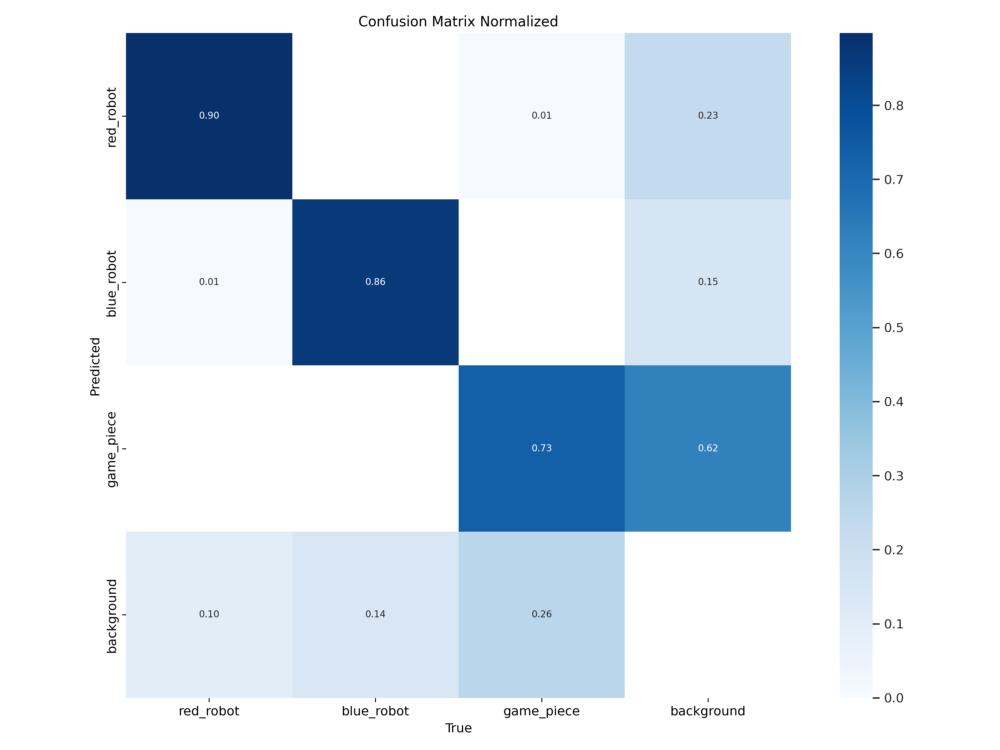

In [13]:
Image(filename=f'runs/detect/train/confusion_matrix_normalized.png', width=1000)

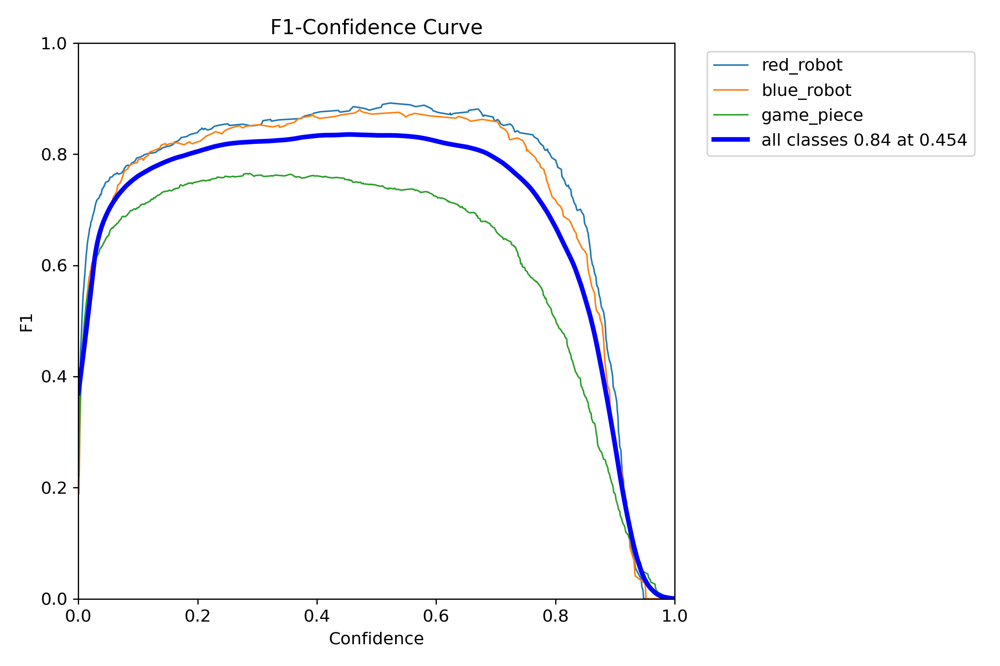

In [14]:
Image(filename=f'runs/detect/train/F1_curve.png', width=1000)

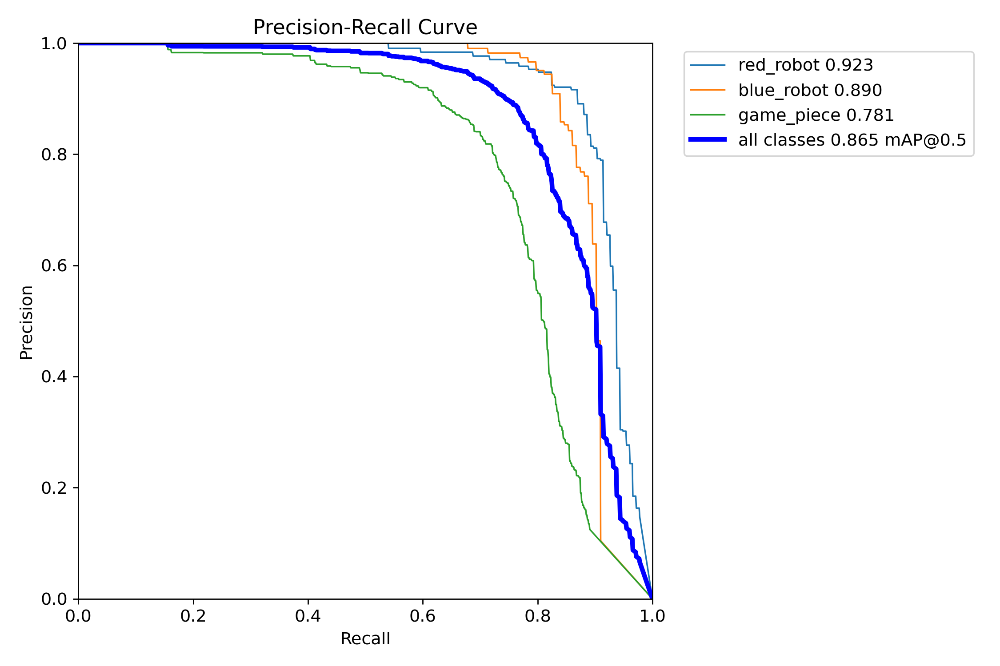

In [15]:
Image(filename=f'runs/detect/train/PR_curve.png', width=1000)

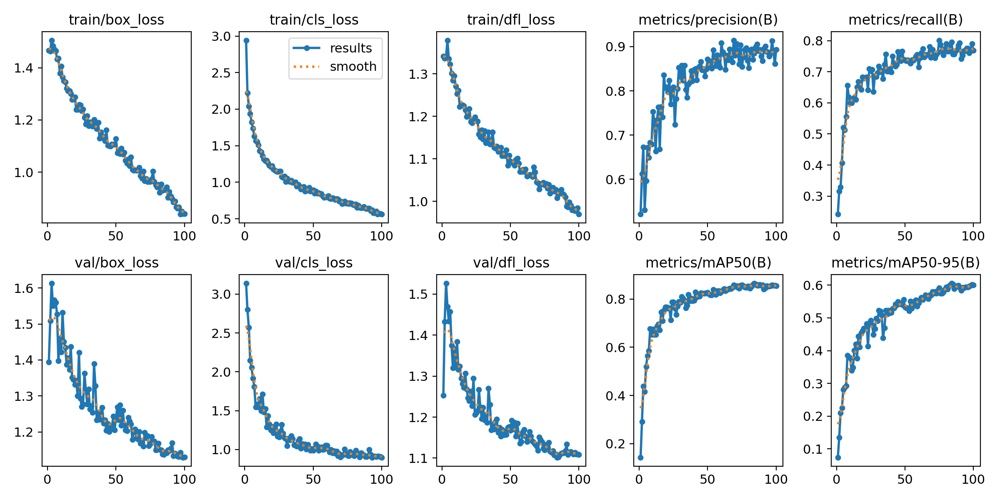

In [16]:
Image(filename=f'runs/detect/train/results.png', width=1000)

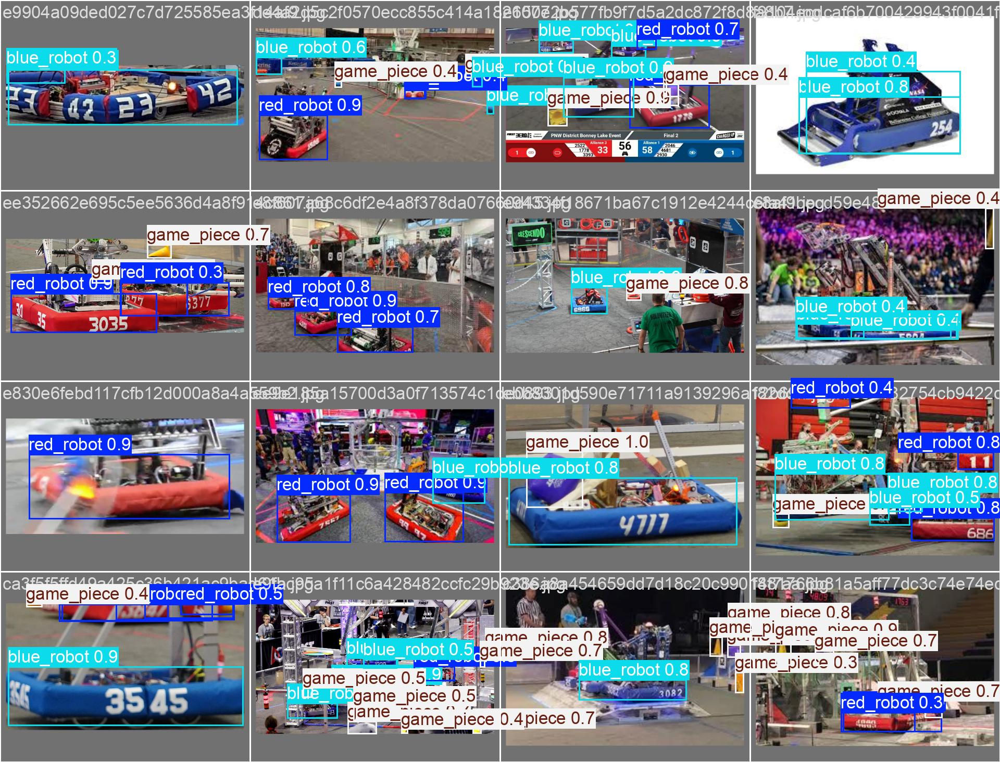

In [17]:
Image(filename=f'runs/detect/train/val_batch0_pred.jpg', width=1000)















# Save the Model

In [18]:
shutil.move("/content/runs/detect/train/weights/best.pt", "/content/drive/MyDrive/spyglass/model8n.pt")

'/content/drive/MyDrive/spyglass/model8n.pt'